In [2]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import math
import scipy.stats as stats

from collections import defaultdict

incidents = pd.read_csv("data/incidents.csv", low_memory=False)
poverty = pd.read_csv("data/povertyByStateYear.csv", low_memory=False)
districts = pd.read_csv("data/year_state_district_house.csv", low_memory=False)
population = pd.read_csv("data/Population by Age and Sex - US, States, Counties.csv", low_memory=False)

In [3]:
from sandbox import clean_incidents

incidents = clean_incidents(incidents)

In [4]:
df = incidents
df['date'] = pd.to_datetime(df['date'], errors='coerce')
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day
df['state'] = df['state']
incidents = df

del df['participant_age1']
del df['participant_age_group1']
del df['participant_gender1']

In [5]:
incidents.info()

<class 'pandas.core.frame.DataFrame'>
Index: 158416 entries, 0 to 239676
Data columns (total 28 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   date                       158416 non-null  datetime64[ns]
 1   state                      158416 non-null  object        
 2   city_or_county             158416 non-null  object        
 3   address                    147152 non-null  object        
 4   latitude                   158416 non-null  float64       
 5   longitude                  158416 non-null  float64       
 6   congressional_district     158416 non-null  float64       
 7   state_house_district       140732 non-null  float64       
 8   state_senate_district      146077 non-null  float64       
 9   min_age_participants       136449 non-null  object        
 10  avg_age_participants       136445 non-null  object        
 11  max_age_participants       136446 non-null  object       

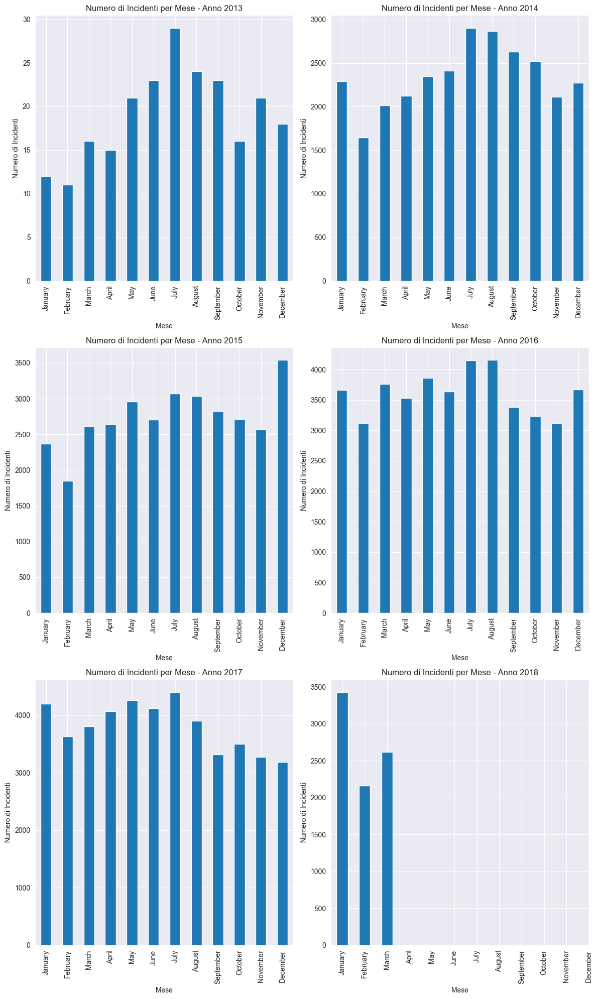

In [6]:
from math import ceil

years = sorted(incidents['year'].unique())
months = sorted(incidents['month'].unique())
months_literal = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October',
                  'November', 'December']
#array di dataframe per anno, raggruppati per mese
incidents_by_year = [incidents[incidents['year'] == year].groupby('month').count() for year in years]
#plot per ogni anno, numero di incidenti per mese, con meses sull'asse x

rows = ceil(len(years) / 2)
cols = 2
plt.figure(figsize=(12, 20))

for i in range(len(incidents_by_year)):
    plt.subplot(rows, cols, i + 1)
    incidents_by_year[i]['date'].plot(kind='bar')
    plt.title(f'Numero di Incidenti per Mese - Anno {years[i]}')
    plt.xlabel('Mese')
    plt.ylabel('Numero di Incidenti')
    plt.xticks(ticks=range(len(months)), labels=months_literal)
    plt.tight_layout()
plt.show()


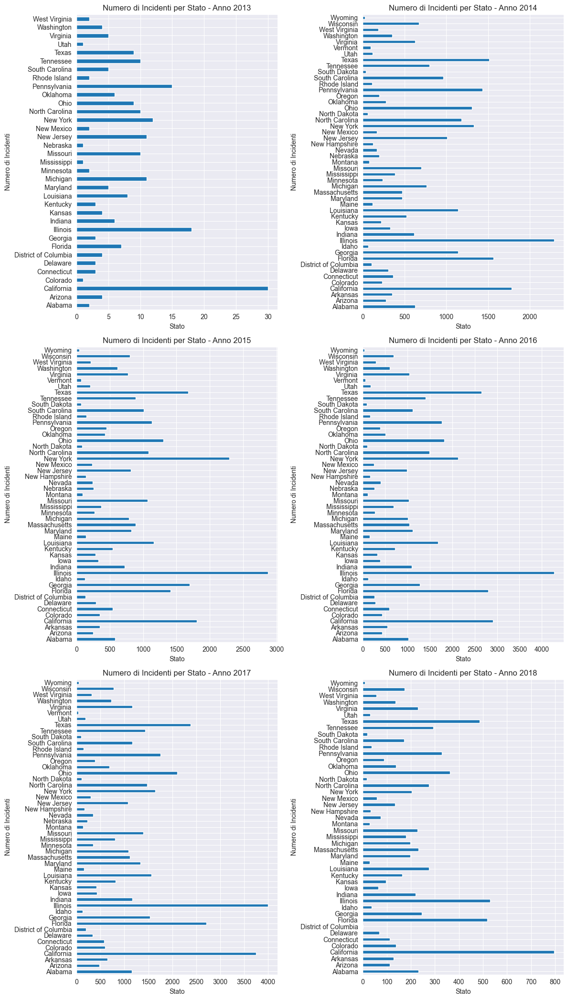

In [7]:
#plot numero di incidenti per stato

incidents_by_year = [incidents[incidents['year'] == year].groupby('state').count() for year in years]
# Impostiamo la griglia di subplot in base al numero di dataframe
rows = ceil(len(years) / 2)
cols = 2

plt.figure(figsize=(12, 7 * rows))

for i in range(len(incidents_by_year)):
    plt.subplot(rows, cols, i + 1)
    incidents_by_year[i]['date'].plot(kind='barh')
    plt.title(f'Numero di Incidenti per Stato - Anno {years[i]}')
    plt.xlabel('Stato')
    plt.ylabel('Numero di Incidenti')
    plt.tight_layout()

plt.show()



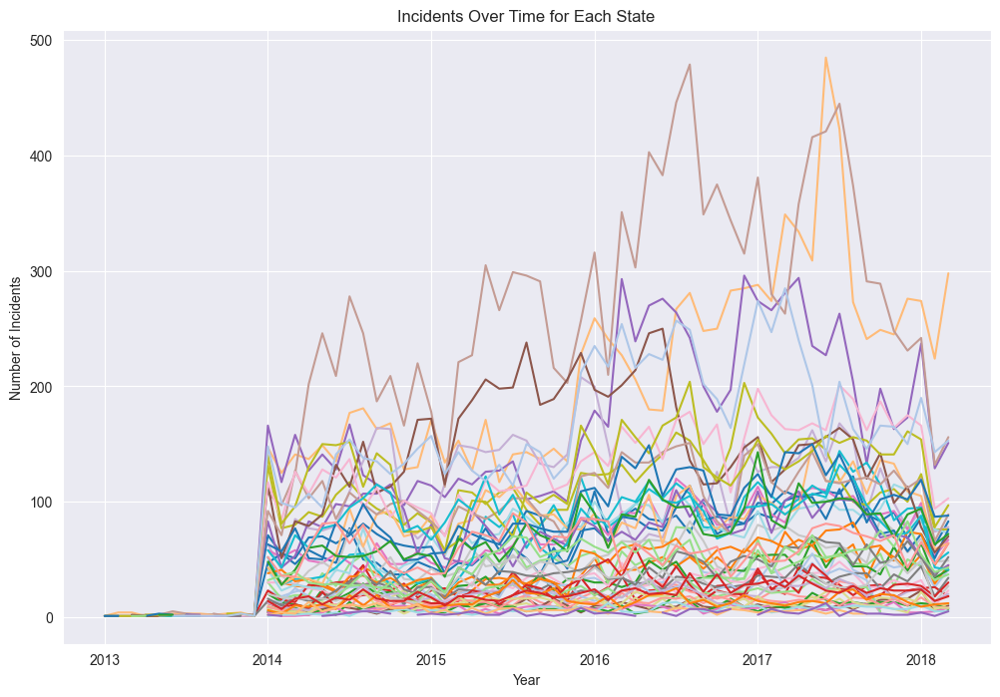

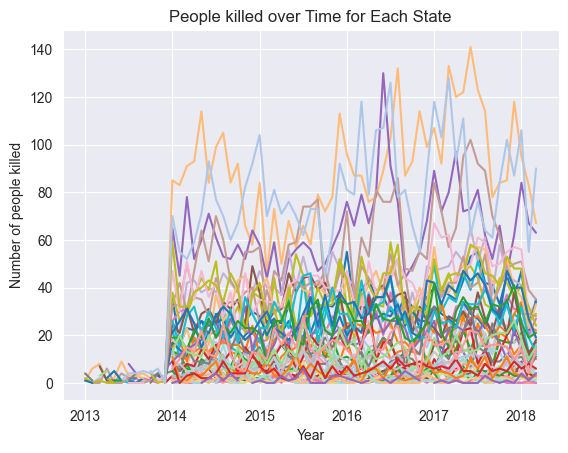

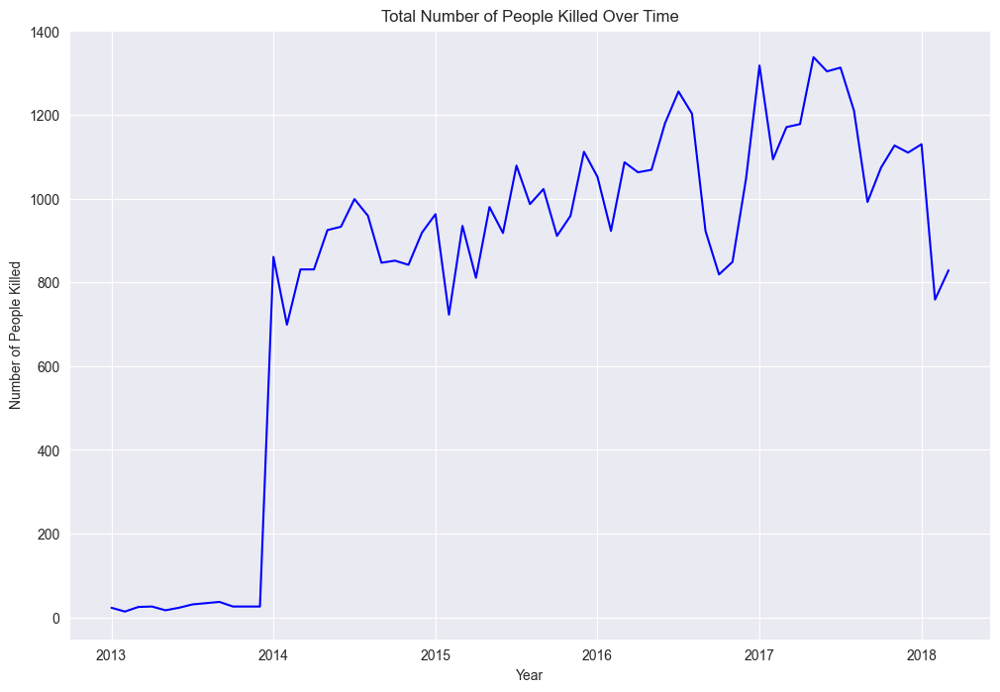

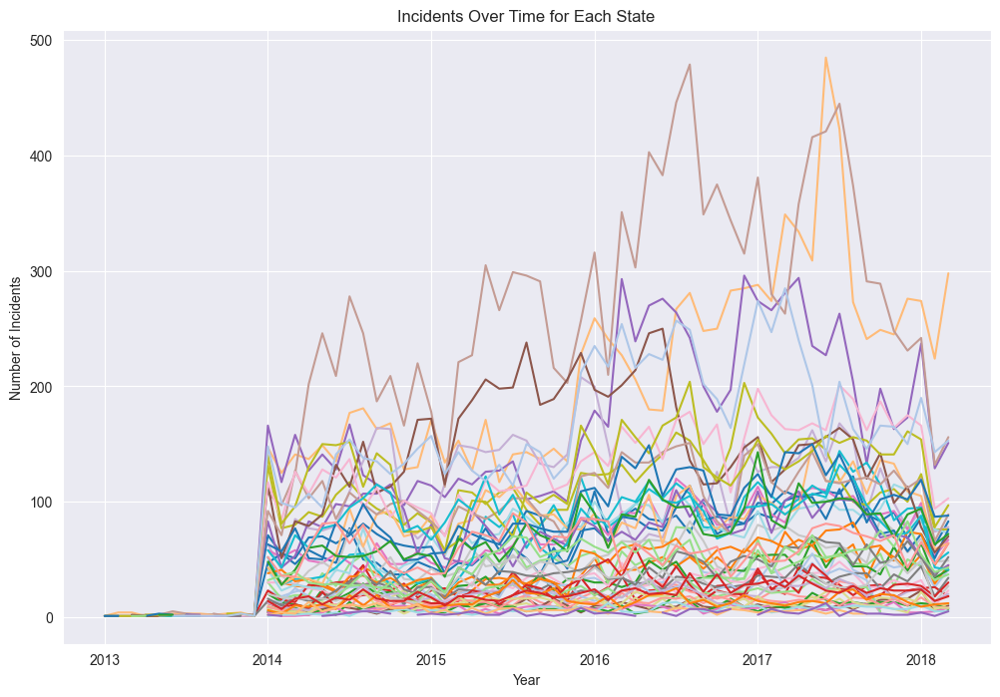

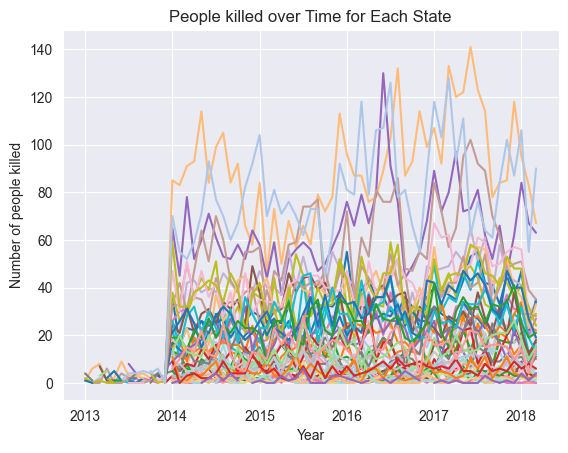

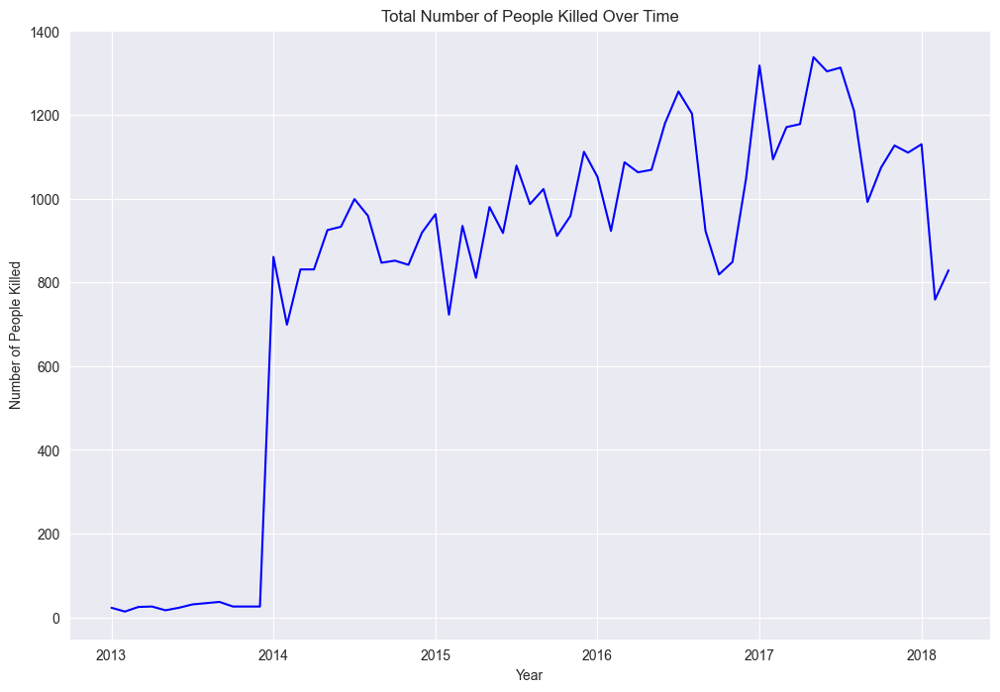

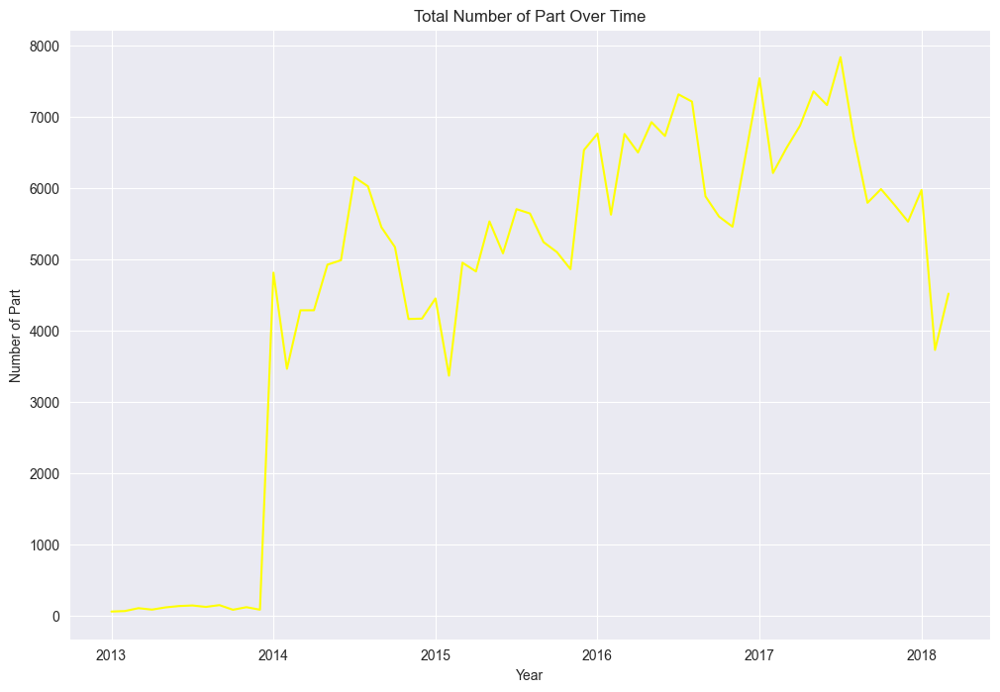

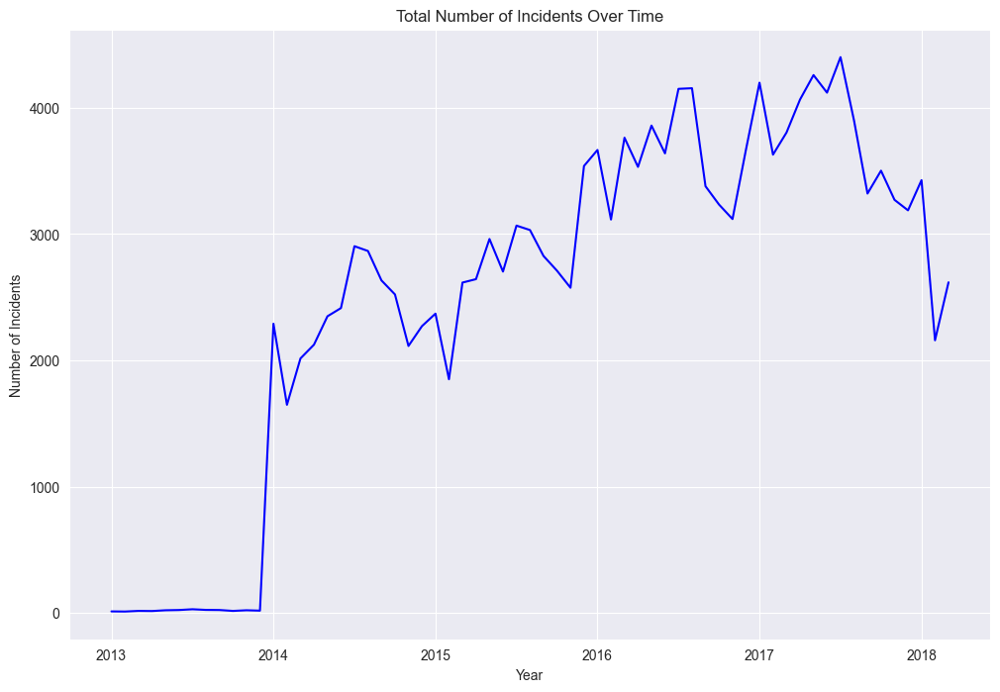

In [8]:
# incidents is the DataFrame containing incident data with 'state', 'year', and 'month' columns

import matplotlib.cm as cm
df = incidents.copy()

# Combine 'year' and 'month' to create a new 'YearMonth' column for a continuous index
incidents['YearMonth'] = incidents['year'] * 12 + incidents['month']

# Group the data by 'YearMonth' and 'state' and count the incidents
grouped_data = incidents.groupby(['YearMonth', 'state']).size().unstack()

plt.figure(figsize=(12, 8))

colors = cm.tab20.colors  # Choose a colormap (tab20) for a broader range of distinct colors

for i, state in enumerate(grouped_data.columns):
    plt.plot(grouped_data.index, grouped_data[state], label=state, color=colors[i % len(colors)])

# Calculate x ticks for the plot representing the year
xticks = range(min(incidents['YearMonth']) // 12, (max(incidents['YearMonth']) // 12) + 1)
plt.xticks(range(min(incidents['YearMonth']), max(incidents['YearMonth']) + 1, 12), xticks)

plt.title('Incidents Over Time for Each State')
plt.xlabel('Year')
plt.ylabel('Number of Incidents')
#plt.legend(title='State')
plt.grid(True)
plt.show()

grouped_data = incidents.groupby(['YearMonth', 'state'])['n_killed'].sum().unstack()
for i, state in enumerate(grouped_data.columns):
    plt.plot(grouped_data.index, grouped_data[state], label=state, color=colors[i % len(colors)])

# Calculate x ticks for the plot representing the year
xticks = range(min(incidents['YearMonth']) // 12, (max(incidents['YearMonth']) // 12) + 1)
plt.xticks(range(min(incidents['YearMonth']), max(incidents['YearMonth']) + 1, 12), xticks)

plt.title('People killed over Time for Each State')
plt.xlabel('Year')
plt.ylabel('Number of people killed')
#plt.legend(title='State')
plt.grid(True)
plt.show()

# Combine 'year' and 'month' to create a new 'YearMonth' column for a continuous index
incidents['YearMonth'] = incidents['year'] * 12 + incidents['month']

# Group the data by 'YearMonth' and sum the number of people killed
grouped_data = incidents.groupby('YearMonth')['n_killed'].sum()

plt.figure(figsize=(12, 8))

plt.plot(grouped_data.index, grouped_data.values, color='blue')  # Using a single color for the plot

# Calculate x ticks for the plot representing the year
xticks = range(min(incidents['YearMonth']) // 12, (max(incidents['YearMonth']) // 12) + 1)
plt.xticks(range(min(incidents['YearMonth']), max(incidents['YearMonth']) + 1, 12), xticks)

plt.title('Total Number of People Killed Over Time')
plt.xlabel('Year')
plt.ylabel('Number of People Killed')
plt.grid(True)
plt.show()

# incidents is the DataFrame containing incident data with 'state', 'year', and 'month' columns

import matplotlib.cm as cm

# Combine 'year' and 'month' to create a new 'YearMonth' column for a continuous index
incidents['YearMonth'] = incidents['year'] * 12 + incidents['month']

# Group the data by 'YearMonth' and 'state' and count the incidents
grouped_data = incidents.groupby(['YearMonth', 'state']).size().unstack()

plt.figure(figsize=(12, 8))

colors = cm.tab20.colors  # Choose a colormap (tab20) for a broader range of distinct colors

for i, state in enumerate(grouped_data.columns):
    plt.plot(grouped_data.index, grouped_data[state], label=state, color=colors[i % len(colors)])

# Calculate x ticks for the plot representing the year
xticks = range(min(incidents['YearMonth']) // 12, (max(incidents['YearMonth']) // 12) + 1)
plt.xticks(range(min(incidents['YearMonth']), max(incidents['YearMonth']) + 1, 12), xticks)

plt.title('Incidents Over Time for Each State')
plt.xlabel('Year')
plt.ylabel('Number of Incidents')
#plt.legend(title='State')
plt.grid(True)
plt.show()

grouped_data = incidents.groupby(['YearMonth', 'state'])['n_killed'].sum().unstack()
for i, state in enumerate(grouped_data.columns):
    plt.plot(grouped_data.index, grouped_data[state], label=state, color=colors[i % len(colors)])

# Calculate x ticks for the plot representing the year
xticks = range(min(incidents['YearMonth']) // 12, (max(incidents['YearMonth']) // 12) + 1)
plt.xticks(range(min(incidents['YearMonth']), max(incidents['YearMonth']) + 1, 12), xticks)

plt.title('People killed over Time for Each State')
plt.xlabel('Year')
plt.ylabel('Number of people killed')
#plt.legend(title='State')
plt.grid(True)
plt.show()

# Combine 'year' and 'month' to create a new 'YearMonth' column for a continuous index
incidents['YearMonth'] = incidents['year'] * 12 + incidents['month']

# Group the data by 'YearMonth' and sum the number of people killed
grouped_data = incidents.groupby('YearMonth')['n_killed'].sum()

plt.figure(figsize=(12, 8))

plt.plot(grouped_data.index, grouped_data.values, color='blue')  # Using a single color for the plot

# Calculate x ticks for the plot representing the year
xticks = range(min(incidents['YearMonth']) // 12, (max(incidents['YearMonth']) // 12) + 1)
plt.xticks(range(min(incidents['YearMonth']), max(incidents['YearMonth']) + 1, 12), xticks)

plt.title('Total Number of People Killed Over Time')
plt.xlabel('Year')
plt.ylabel('Number of People Killed')
plt.grid(True)
plt.show()

# Group the data by 'YearMonth' and sum the number of people killed
grouped_data = incidents.groupby('YearMonth')['n_participants'].sum()

plt.figure(figsize=(12, 8))

plt.plot(grouped_data.index, grouped_data.values, color='yellow')  # Using a single color for the plot

# Calculate x ticks for the plot representing the year
xticks = range(min(incidents['YearMonth']) // 12, (max(incidents['YearMonth']) // 12) + 1)
plt.xticks(range(min(incidents['YearMonth']), max(incidents['YearMonth']) + 1, 12), xticks)

plt.title('Total Number of Part Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Part')
plt.grid(True)
plt.show()

# Group the data by 'YearMonth' and sum the number of people killed
grouped_data = incidents.groupby('YearMonth').size()

plt.figure(figsize=(12, 8))

plt.plot(grouped_data.index, grouped_data.values, color='blue')  # Using a single color for the plot

# Calculate x ticks for the plot representing the year
xticks = range(min(incidents['YearMonth']) // 12, (max(incidents['YearMonth']) // 12) + 1)
plt.xticks(range(min(incidents['YearMonth']), max(incidents['YearMonth']) + 1, 12), xticks)

plt.title('Total Number of Incidents Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Incidents')
plt.grid(True)
plt.show()


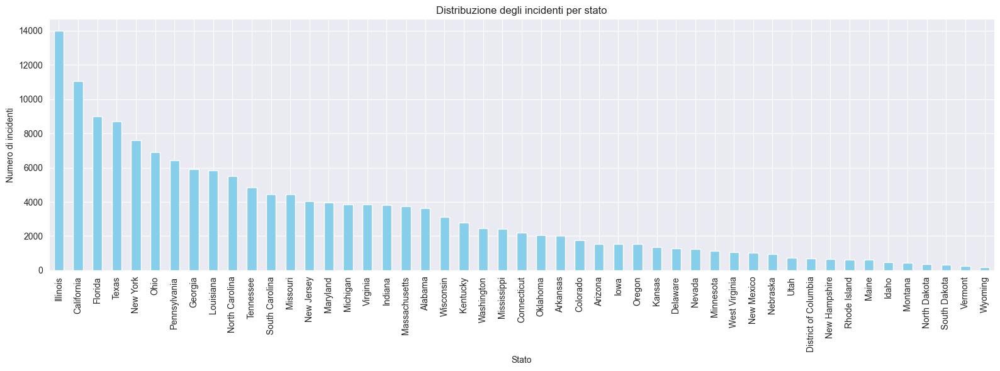

In [9]:
#plot numero di incidenti per ogni stato con bar

incidents = df

# Conta il numero di incidenti per stato
incidenti_per_stato = incidents['state'].value_counts()

# Crea l'istogramma
plt.figure(figsize=(16, 6))
incidenti_per_stato.plot(kind='bar', color='skyblue')
plt.title('Distribuzione degli incidenti per stato')
plt.xlabel('Stato')
plt.ylabel('Numero di incidenti')
plt.tight_layout()
plt.show()


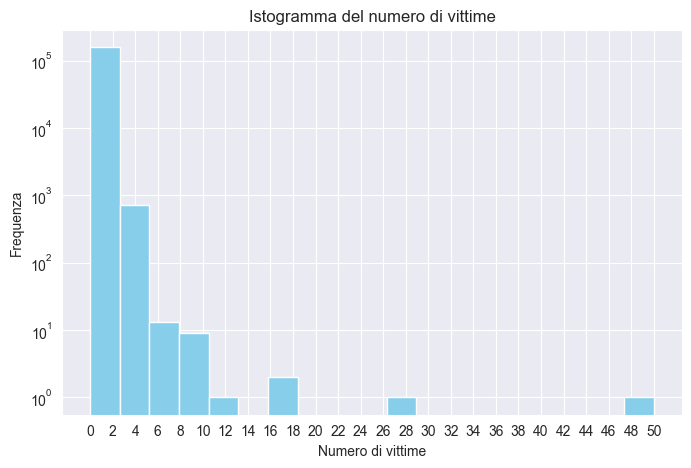

In [10]:
# Calcolo del numero di bins basato sulla regola di Sturges
killed = incidents
n = len(killed)
num_bins = int(np.ceil(np.log2(n) + 1))

# Creiamo un istogramma con un numero specifico di bins
plt.figure(figsize=(8, 5))
plt.hist(killed['n_killed'], bins=num_bins, color='skyblue')  # Possiamo cambiare il numero di bins
plt.title('Istogramma del numero di vittime')
plt.xlabel('Numero di vittime')
plt.ylabel('Frequenza')
plt.xticks(np.arange(0, killed['n_killed'].max() + 1, 2))
plt.yscale('log')  # Impostazione della scala logaritmica sull'asse y
plt.show()

In [11]:
# Calcolare la media dei morti
media_morti = killed['n_killed'].mean()

# Calcolare la moda dei morti
moda_morti = killed['n_killed'].mode()

# Calcolare la mediana dei morti
mediana_morti = killed['n_killed'].median()

print(f"Media dei morti: {media_morti}")
print(f"Moda dei morti: {moda_morti}")
print(f"Mediana dei morti: {mediana_morti}")


Media dei morti: 0.3258824866175134
Moda dei morti: 0    0
Name: n_killed, dtype: int64
Mediana dei morti: 0.0


In [12]:
poverty = poverty.dropna()
states = sorted(incidents['state'].unique())
districts['state'] = districts.state.str.title()
poverty_by_party = pd.merge(poverty, districts, on=['state', 'year'], how='inner')
incidents_by_party = pd.merge(incidents, districts, on=['state', 'year', 'congressional_district'], how='inner')
incidents_by_poverty = pd.merge(incidents, poverty, on=['state', 'year'], how='inner')

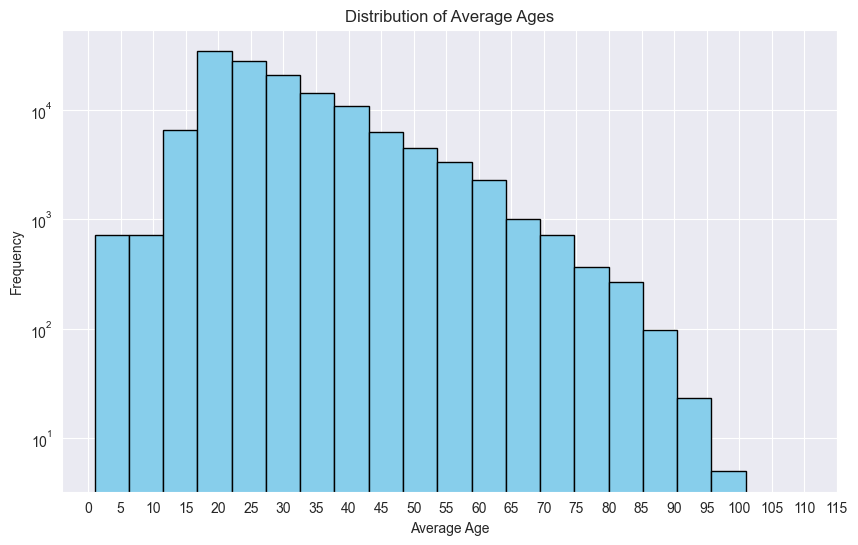

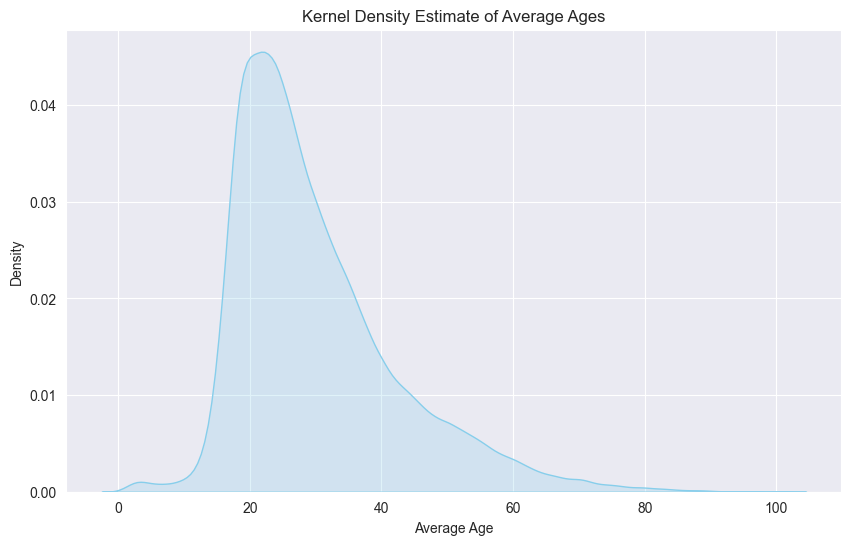

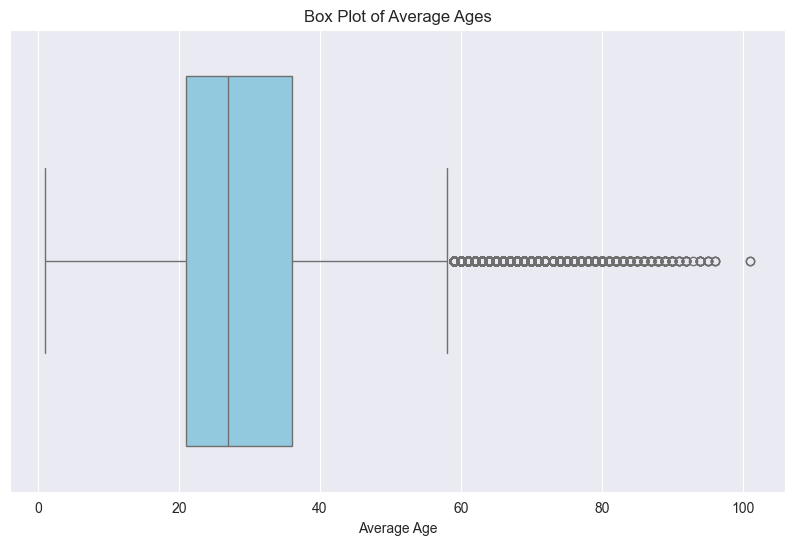

In [13]:
import seaborn as sns
from utils import sturges_bins

dataset = incidents[incidents['avg_age_participants'] > 0]
plt.figure(figsize=(10, 6))
plt.hist(dataset['avg_age_participants'], bins=sturges_bins(dataset, 'avg_age_participants'), color='skyblue',
         edgecolor='black')
plt.yscale('log')
plt.xticks(range(0, 120, 5))
plt.title('Distribution of Average Ages')
plt.xlabel('Average Age')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 6))
sns.kdeplot(dataset['avg_age_participants'], fill=True, color='skyblue')
plt.title('Kernel Density Estimate of Average Ages')
plt.xlabel('Average Age')
plt.ylabel('Density')
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(x=dataset['avg_age_participants'], color='skyblue')
plt.title('Box Plot of Average Ages')
plt.xlabel('Average Age')
plt.show()


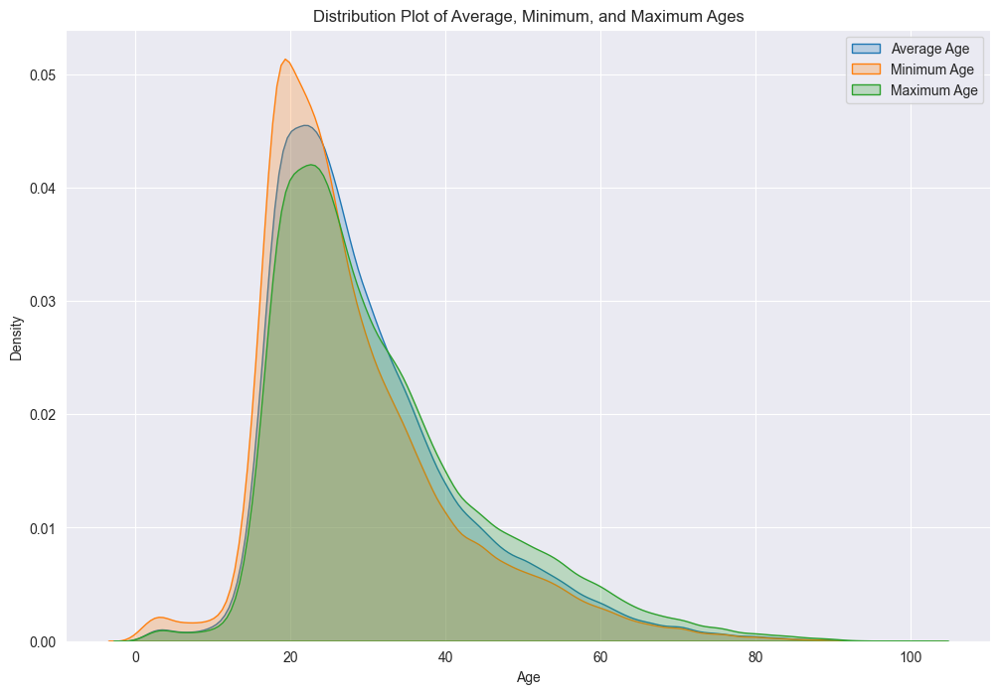

<Figure size 1200x800 with 0 Axes>

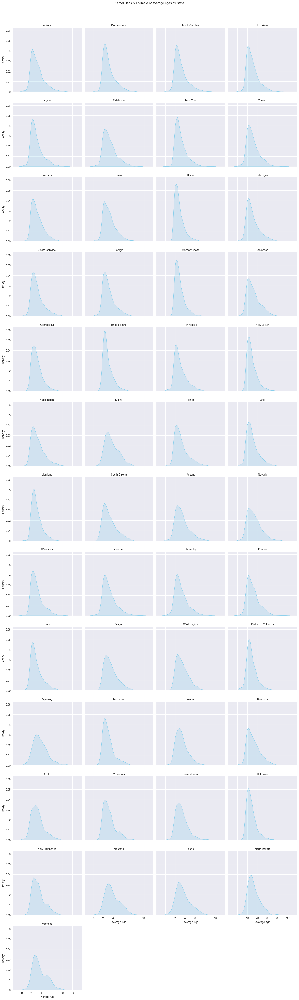

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


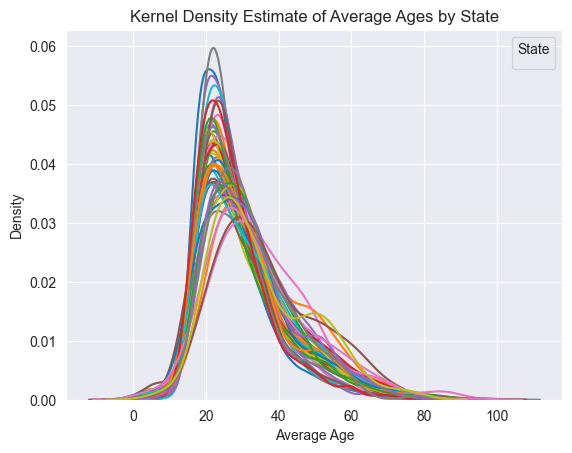

In [14]:
# Assuming 'avg_age_participants', 'min_age_participants', and 'max_age_participants' are columns in your dataset
plt.figure(figsize=(12, 8))

sns.kdeplot(dataset['avg_age_participants'], fill=True, label='Average Age')
sns.kdeplot(dataset['min_age_participants'], fill=True, label='Minimum Age')
sns.kdeplot(dataset['max_age_participants'], fill=True, label='Maximum Age')

plt.title('Distribution Plot of Average, Minimum, and Maximum Ages')
plt.xlabel('Age')
plt.ylabel('Density')
plt.legend()
plt.show()

# Assuming 'state' is a column in your dataset
plt.figure(figsize=(12, 8))
g = sns.FacetGrid(dataset, col="state", col_wrap=4, height=4)
g.map(sns.kdeplot, 'avg_age_participants', fill=True, color='skyblue')
g.set_titles(col_template="{col_name}")
g.set_axis_labels('Average Age', 'Density')
plt.suptitle('Kernel Density Estimate of Average Ages by State', y=1.02)
plt.show()

# Assuming 'state' is a column in your dataset
for state in dataset['state'].unique():
    sns.kdeplot(dataset[dataset['state'] == state]['avg_age_participants'])

plt.title('Kernel Density Estimate of Average Ages by State')
plt.xlabel('Average Age')
plt.ylabel('Density')
plt.legend(title='State')
plt.show()


In [15]:

import plotly.express as px
temp = incidents[(incidents['n_killed'] < 25) & (incidents['n_killed'] > 0)]
fig = px.scatter_mapbox(temp, 
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="date", 
                        hover_data=["state"],
                        size="n_participants",
                        color="n_killed",  # Set the color based on "n_killed"
                        color_continuous_scale=px.colors.sequential.Plasma,  # Choose a color scale
                        zoom=3, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

#for state in states:
#    temp.date.dt.day[temp.state == state].plot(kind='kde') #Generate Kernel Density Estimate plot using Gaussian kernels.
#plt.title('Tip Density Plot by day')
#plt.legend(states, loc='best')

#plt.show()
###

In [16]:
temp = incidents.groupby(['year', 'state']).count()

In [17]:
join = pd.merge(temp, poverty, on=['state', 'year'], how='inner')

In [18]:
join[['state', 'year', 'date', 'povertyPercentage']]


,state,year,date,povertyPercentage
0,Alabama,2013,2,17.5
1,Arizona,2013,4,18.7
2,California,2013,30,14.9
3,Colorado,2013,1,11.0
4,Connecticut,2013,3,9.5
...,...,...,...,...
272,Virginia,2018,229,8.8
273,Washington,2018,136,7.9
274,West Virginia,2018,56,14.6
275,Wisconsin,2018,175,8.3


In [19]:
population.describe()

,IBRC_Geo_ID,Statefips,Countyfips,Year,Total Population,Population 0-4,Population 5-17,Population 18-24,Population 25-44,Population 45-64,Population 65+,Population Under 18,Population 18-54,Population 55+,Male Population,Female Population
count,63882.000000,63882.000000,63882.000000,63882.000000,6.388200e+04,6.388200e+04,6.388200e+04,6.388200e+04,6.388200e+04,6.388200e+04,6.388200e+04,6.388200e+04,6.388200e+04,6.388200e+04,6.388200e+04,6.388200e+04
mean,30371.383332,30.269466,101.917755,2009.498450,2.888215e+05,1.867119e+04,5.050515e+04,2.827779e+04,7.892834e+04,7.298253e+04,3.945645e+04,6.917634e+04,1.472255e+05,7.241957e+04,1.420293e+05,1.468318e+05
std,15181.381977,15.163258,107.737911,5.766237,5.555701e+06,3.593462e+05,9.712081e+05,5.439508e+05,1.518993e+06,1.406884e+06,7.646186e+05,1.330525e+06,2.831258e+06,1.404978e+06,2.732597e+06,2.823886e+06
min,0.000000,0.000000,0.000000,2000.000000,5.500000e+01,0.000000e+00,0.000000e+00,0.000000e+00,1.100000e+01,2.300000e+01,5.000000e+00,0.000000e+00,2.700000e+01,1.600000e+01,2.900000e+01,2.600000e+01
25%,18173.000000,18.000000,33.000000,2004.000000,1.126600e+04,6.700000e+02,1.945000e+03,9.090000e+02,2.619000e+03,3.016000e+03,1.913000e+03,2.617000e+03,5.104250e+03,3.349000e+03,5.626000e+03,5.575250e+03
50%,29177.000000,29.000000,77.000000,2009.000000,2.619000e+04,1.612000e+03,4.554000e+03,2.268000e+03,6.436000e+03,7.002500e+03,4.143500e+03,6.171000e+03,1.249250e+04,7.453500e+03,1.304300e+04,1.311850e+04
75%,45077.000000,45.000000,133.000000,2014.000000,7.034750e+04,4.337000e+03,1.221075e+04,6.828000e+03,1.767875e+04,1.849050e+04,1.044075e+04,1.651875e+04,3.455300e+04,1.911775e+04,3.490475e+04,3.551275e+04
max,72000.000000,72.000000,840.000000,2019.000000,3.282395e+08,2.027113e+07,5.393185e+07,3.148842e+07,8.759946e+07,8.410711e+07,5.405826e+07,7.413417e+07,1.587748e+08,9.650680e+07,1.616923e+08,1.666376e+08


In [20]:
population = population[(population['Countyfips'] == 0) & (population['Year'] <= 2018) & (population['Year'] >= 2013)]
population = population.drop(
    columns=['IBRC_Geo_ID', 'Statefips', 'Countyfips', 'Population 0-4', 'Population 5-17', 'Population 18-24',
             'Population 25-44', 'Population 45-64', 'Population 65+'])


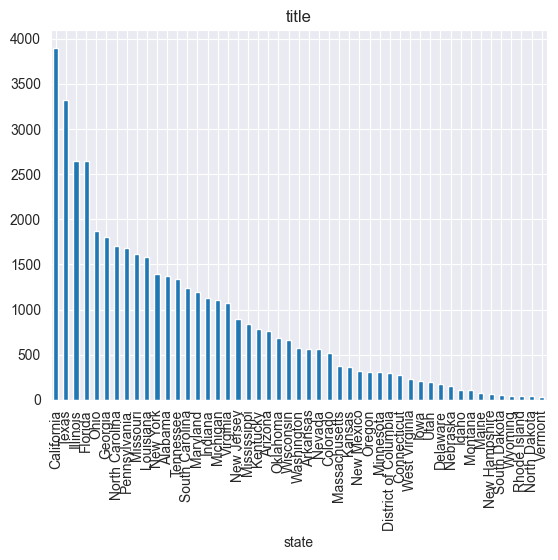

In [21]:
killed = incidents
killed = killed[(killed['year'] < 2018) & (killed['year'] > 2013)]

killed = killed[(killed['n_killed'] > 0)]

killed['state'].value_counts().plot(kind='bar', title='title')
plt.show()


Density of incidents in the year 2013
                   State  Incident Density per 100k
0   District of Columbia                   0.614835
1               Delaware                   0.324824
2           Rhode Island                   0.189559
3              Louisiana                   0.172991
4               Missouri                   0.165543
5               Oklahoma                   0.155714
6              Tennessee                   0.153980
7               Illinois                   0.139588
8                 Kansas                   0.138255
9             New Jersey                   0.124196
10          Pennsylvania                   0.117405
11              Michigan                   0.110965
12         West Virginia                   0.107880
13        South Carolina                   0.104952
14        North Carolina                   0.101592
15            New Mexico                   0.095590
16               Indiana                   0.091342
17              Maryland  

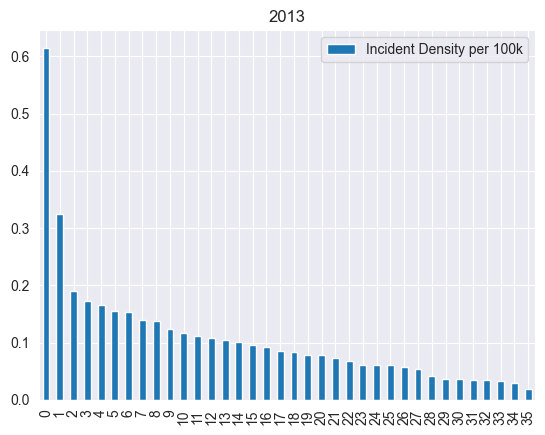

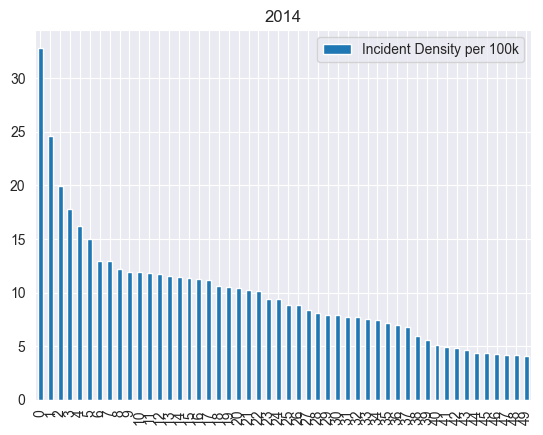

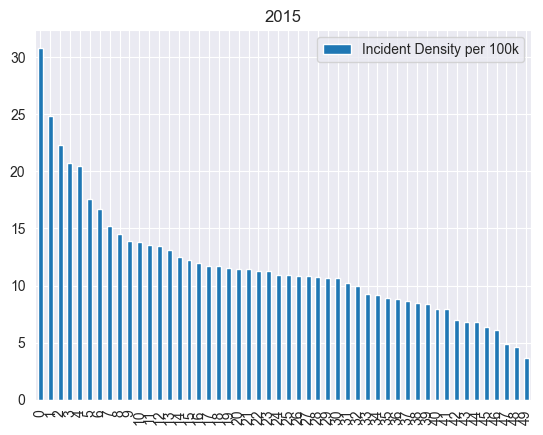

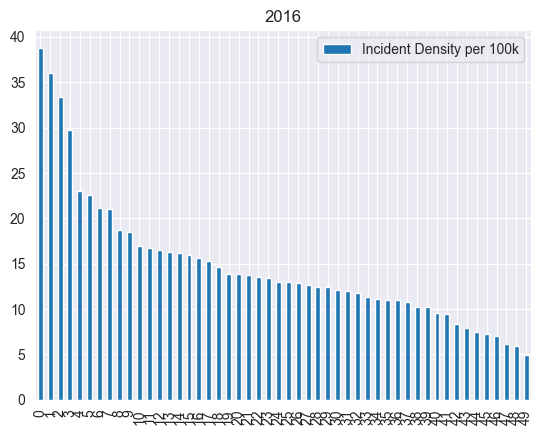

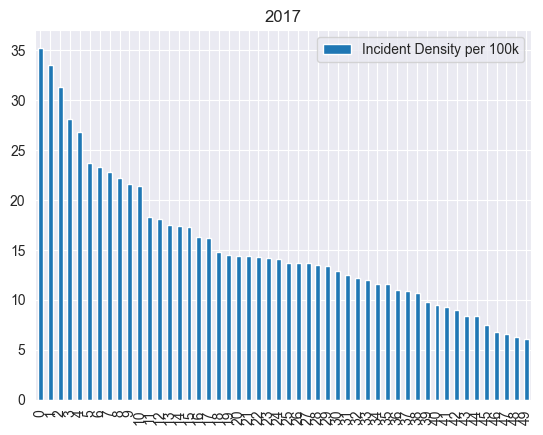

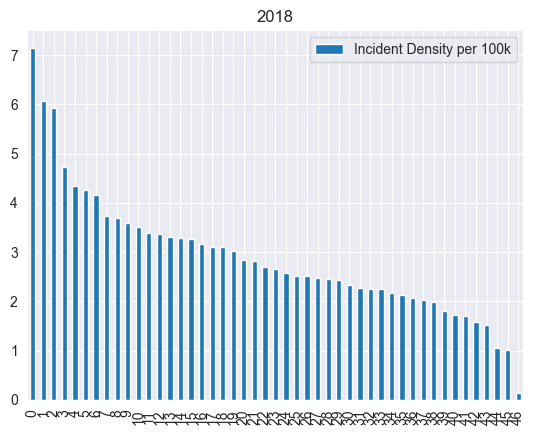

In [22]:
from sandbox import den_incidents

for year in sorted(incidents['year'].unique()):
    den_incidents(year, incidents, population).plot(
        kind='bar')  #Generate Kernel Density Estimate plot using Gaussian kernels.
    plt.title(year)

plt.show()
#den_incidents(2014, incidents, population)

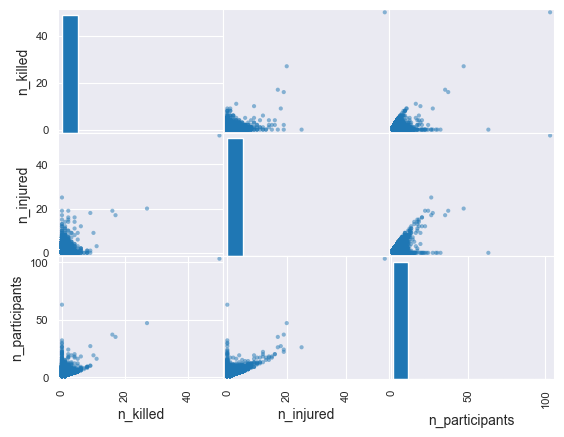

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

df = incidents
# Select columns for scatter matrix
scatter_cols = ['n_killed', 'n_injured', 'n_males', 'n_females', 'n_participants']

# Create a scatter matrix using Matplotlib
scatter_data = df[scatter_cols]

#scatter_data = scatter_data[scatter_data['n_killed'] < 25]
#scatter_data = scatter_data[scatter_data['n_males'] < 50]
#scatter_data = scatter_data[scatter_data['n_participants'] < 50]

from sklearn.preprocessing import MinMaxScaler, StandardScaler

#scaler = StandardScaler()
#scaled = pd.DataFrame(scaler.fit_transform(scatter_data), columns=scatter_data.columns)

pd.plotting.scatter_matrix(scatter_data)
plt.show()


<Axes: >

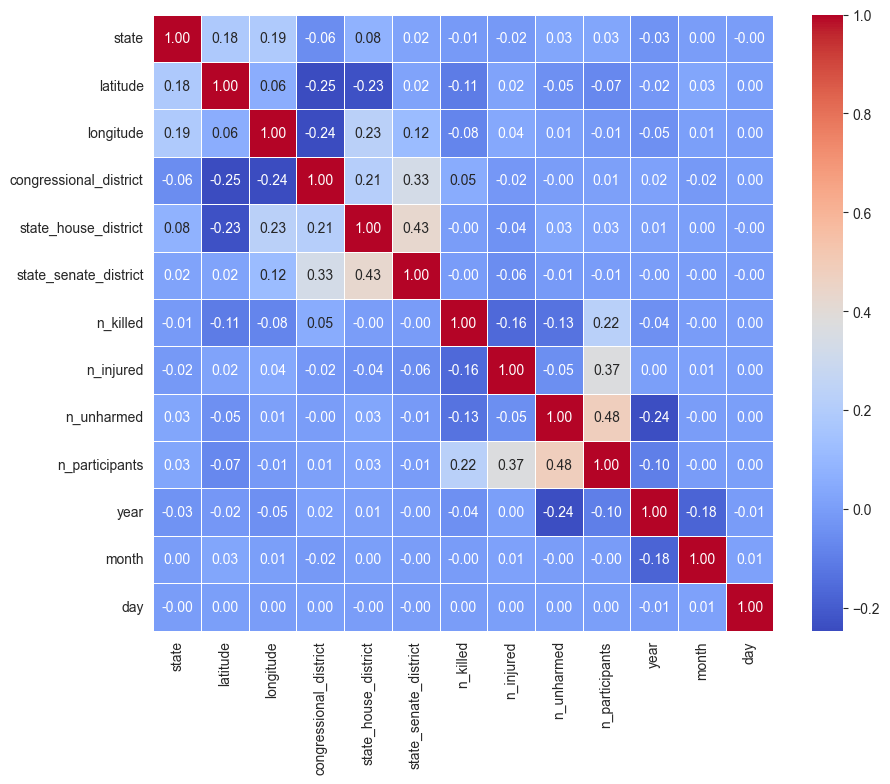

In [24]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
# Compute the correlation matrix
df = incidents
plt.figure(figsize=(10, 8))

df['state'] = LabelEncoder().fit_transform(df['state'])

correlation_matrix = df.select_dtypes(include='number').corr()

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5, annot_kws={"size": 10})


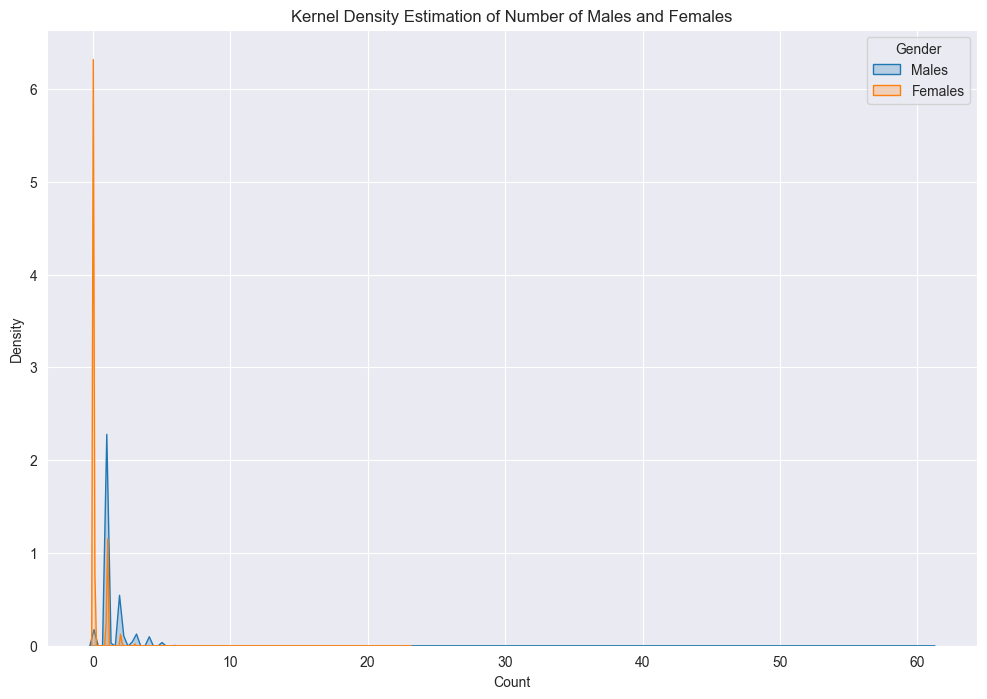

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'n_males' and 'n_females' are columns in the 'incidents' DataFrame

plt.figure(figsize=(12, 8))

# KDE Plot for Males
sns.kdeplot(data=incidents['n_males'], label='Males', fill=True)

# KDE Plot for Females
sns.kdeplot(data=incidents['n_females'], label='Females', fill=True)

plt.title('Kernel Density Estimation of Number of Males and Females')
plt.xlabel('Count')
plt.ylabel('Density')
plt.legend(title='Gender')
plt.show()